# Worksheet 07

Name:  Hao Qi  
UID:  U96305250

### Topics

- Density-Based Clustering

### Density-Based Clustering

Follow along with the live coding of the DBScan algorithm.

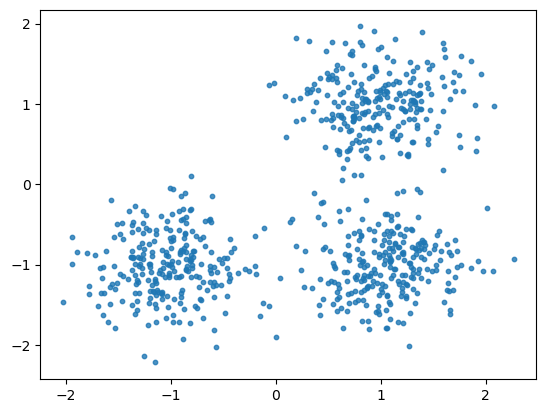

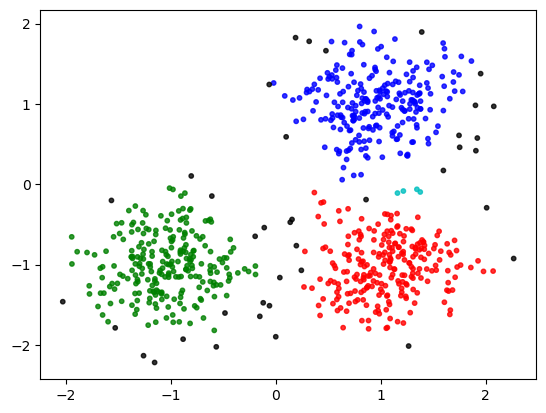

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

centers = [[1, 1], [-1, -1], [1, -1]]
X, _ = datasets.make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)
plt.scatter(X[:,0], X[:,1], s=10, alpha=0.8)
plt.show()

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon
        self.assignments = [-1 for _ in range (len(self.dataset))]
    
    def distance(self, i, j):
        return np.linalg.norm(self.dataset[i] - self.dataset[j])
    
    def get_neighborhood(self, i):
        neighborhood = []
        for j in range(len(self.dataset)):
            if i != j and self.distance(i,j) <= self.epsilon:
                neighborhood.append(j)
        return neighborhood
    
    def is_core(self, i):
        return len(self.get_neighborhood(i)) >= self.min_pts
    
    def is_unassigned(self, i):
        return self.assignments[i] == -1
    
    def get_unassigned_neighborhood(self, i):
        neighborhood = self.get_neighborhood(i)
        return [point for point in neighborhood if self.is_unassigned(point)]
    
    def make_cluster(self, i, cluster_num):
        self.assignments[i] = cluster_num
        neighborhood_queue = self.get_unassigned_neighborhood(i) 

        while neighborhood_queue:
            next_pt = neighborhood_queue.pop()
            if not self.is_unassigned(next_pt):
                continue
            self.assignments[next_pt] = cluster_num
            if self.is_core(next_pt):
                neighborhood_queue += self.get_unassigned_neighborhood(next_pt)

        return 

    def dbscan(self):
        """
        Returns a list of assignments 
        The index of the assignment should match the index of the data point in the dataset.
        """
        cluster_num = 0
        for i in range(len(self.dataset)):
            if self.assignments[i] != -1:
                continue
            if self.is_core(i):
                # start building a new cluster
                self.make_cluster(i, cluster_num)
                cluster_num += 1

        return self.assignments
    

clustering = DBC(X, 3, .2).dbscan()
colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 200)
plt.scatter(X[:,0], X[:,1], color=colors[clustering].tolist(), s=10, alpha=0.8)
plt.show()

## Challenge Problem

Using the code above and the template below, create the animation below of the DBScan algorithm.

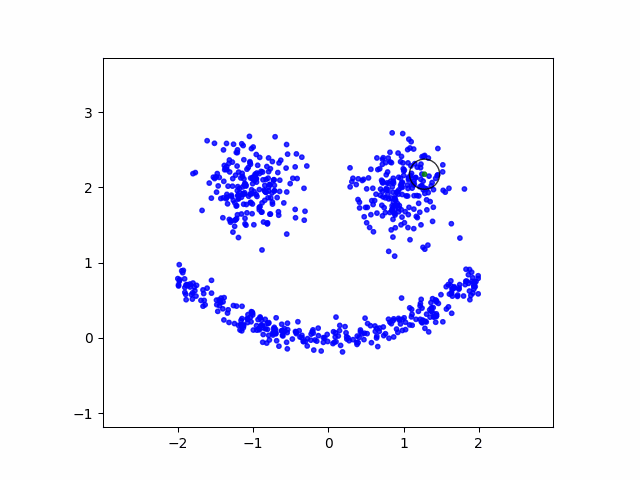

In [2]:
from IPython.display import Image
Image(filename="dbscan_2.gif", width=500, height=500)

Hints:

- First animate the dbscan algorithm for the dataset used in class (before trying to create the above dataset)
- Take a snapshot of the assignments when the point gets assigned to a cluster
- Confirm that the snapshot works by saving it to a file
- Don't forget to close the plot after saving the figure
- Gather the snapshots in a list of images that you can then save as a gif using the code below
- Use `ax.set_aspect('equal')` so that the circles don't appear to be oval shaped
- To create the above dataset you need two blobs for the eyes. For the mouth you can use the following process to generate (x, y) pairs:
  - Pick an x at random in an interval that makes sense given where the eyes are positioned
  - For that x generate y that is 0.2 * x^2 plus a small amount of randomness
  - `zip` the x's and y's together and append them to the dataset containing the blobs

Animate the dbscan algorithm for the dataset used in class: 

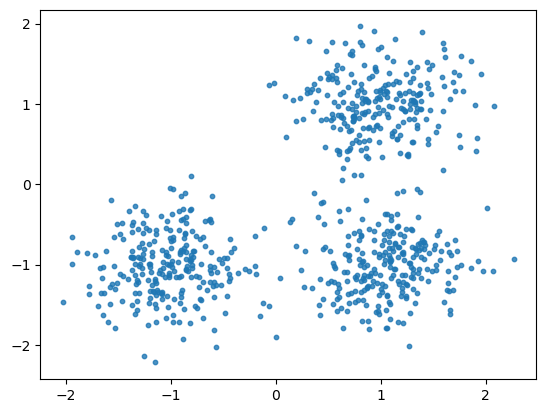

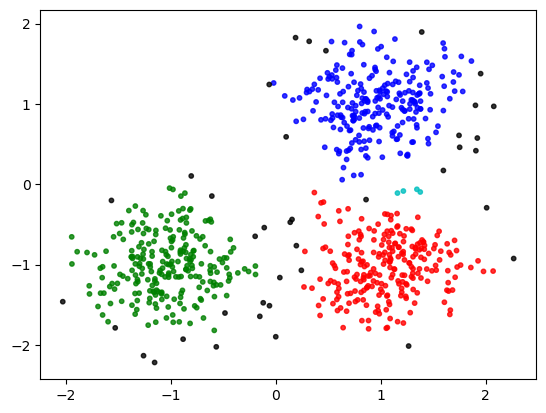

In [6]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets


TEMPFILE = "origin_snapshot_haoqi.png"


class DBC():
    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon
        self.assignments = [-1 for _ in range (len(self.dataset))]
        self.snaps = []
    
    def distance(self, i, j):
        return np.linalg.norm(self.dataset[i] - self.dataset[j])
    
    def get_neighborhood(self, i):
        neighborhood = []
        for j in range(len(self.dataset)):
            if i != j and self.distance(i,j) <= self.epsilon:
                neighborhood.append(j)
        return neighborhood
    
    def is_core(self, i):
        return len(self.get_neighborhood(i)) >= self.min_pts
    
    def is_unassigned(self, i):
        return self.assignments[i] == -1
    
    def get_unassigned_neighborhood(self, i):
        neighborhood = self.get_neighborhood(i)
        return [point for point in neighborhood if self.is_unassigned(point)]
    
    def make_cluster(self, i, cluster_num):
        self.assignments[i] = cluster_num
        self.snaps.append(self.snapshot(i))
        neighborhood_queue = self.get_unassigned_neighborhood(i) 

        while neighborhood_queue:
            next_pt = neighborhood_queue.pop()
            if not self.is_unassigned(next_pt):
                continue
            self.assignments[next_pt] = cluster_num
            self.snaps.append(self.snapshot(next_pt))
            if self.is_core(next_pt):
                neighborhood_queue += self.get_unassigned_neighborhood(next_pt)

        return 

    def dbscan(self):
        """
        Returns a list of assignments 
        The index of the assignment should match the index of the data point in the dataset.
        """
        cluster_num = 0
        for i in range(len(self.dataset)):
            if self.assignments[i] != -1:
                continue
            if self.is_core(i):
                # start building a new cluster
                self.make_cluster(i, cluster_num)
                cluster_num += 1

        return self.assignments
    
    def snapshot(self, cur_point=None):
        fig, ax = plt.subplots()
        colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
        colors = np.hstack([colors] * 200)

        ax.scatter(self.dataset[:,0], self.dataset[:,1], color=colors[self.assignments].tolist(), s=10, alpha=0.8)
        for i, point in enumerate(self.dataset):
            if cur_point is not None and i == cur_point:
                # create a circle around the currently processed point
                cir = plt.Circle(point, self.epsilon, color='k', fill=False, lw=1.5)
                ax.add_patch(cir)

        # set axis limits based on dataset bounds with padding
        x_coords, y_coords = zip(*self.dataset)
        padding = 1
        ax.set_xlim(min(x_coords) - padding, max(x_coords) + padding)
        ax.set_ylim(min(y_coords) - padding, max(y_coords) + padding)
        ax.set_aspect('equal')

        fig.savefig(TEMPFILE)
        plt.close()

        return im.fromarray(np.asarray(im.open(TEMPFILE)))
    

centers = [[1, 1], [-1, -1], [1, -1]]
X, _ = datasets.make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)
plt.scatter(X[:,0], X[:,1], s=10, alpha=0.8)
plt.show()

dbc = DBC(X, 3, .2)
clustering = dbc.dbscan()
colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 200)
plt.scatter(X[:,0], X[:,1], color=colors[clustering].tolist(), s=10, alpha=0.8)
plt.show()

dbc.snaps[0].save(
    'origin_dbscan_haoqi.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)

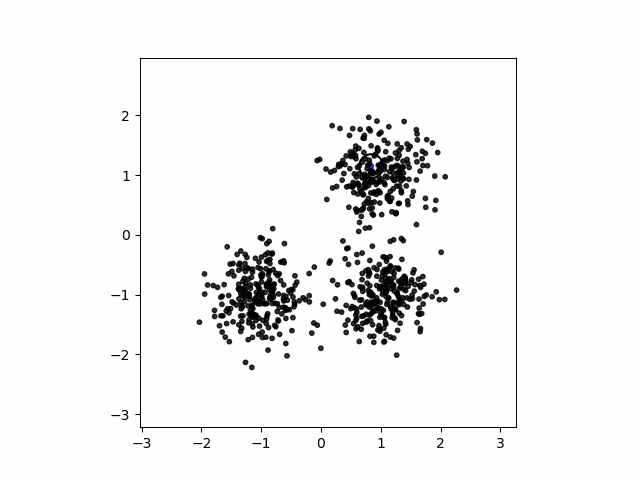

In [7]:
Image(filename="origin_dbscan_haoqi.gif", width=500, height=500)

In [ ]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts 
        self.epsilon = epsilon
        self.snaps = []


    def snapshot(self):
        fig, ax = plt.subplots()
        colors = ...

        ax.scatter(...)
        cir = plt.Circle(...) # create circle around the point assigned
        ax.add_patch(cir)
        ax.set_xlim(...)
        ax.set_ylim(...)
        ax.set_aspect('equal') # necessary or else the circles appear to be oval shaped

        fig.savefig(TEMPFILE)
        plt.close()

        return im.fromarray(np.asarray(im.open(TEMPFILE)))


    def dbscan(self):
        ...
        return


centers = [...]
eyes, _ = datasets.make_blobs(...)

mouth_x = ... * np.random.random(...)
mouth_y = ... + .1 * np.random.randn(...)

face = np.append(eyes, ..., axis=0)

dbc = DBC(face, ..., ...)
clustering = dbc.dbscan()

dbc.snaps[0].save(
    'dbscan.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)